## 1. Data preparation and cleaning

### 1.1 Datasets used
1. Cleaned text of the trilogy books (https://github.com/Nab-88/social-graphs-and-interactions/tree/master/datasets)
2. Cleaned character names scrapped from LOTR fanwiki (https://lotr.fandom.com/wiki/Main_Page)
3. Cleaned aliases of characters from LOTR fanwiki (https://lotr.fandom.com/wiki/Main_Page)

Webscrapping code to extract character names and aliases is available in <b>LOTR_wiki_scrapping.ipynb</b>

#### 1.2 Loading data

Read in all the book volumes

In [1]:
with open('data/LOTR_book1_cleaned.txt', 'r', encoding='utf-8') as myfile:
    LOTR_vol1=myfile.read()
with open('data/LOTR_book2_cleaned.txt', 'r', encoding='utf-8') as myfile:
    LOTR_vol2=myfile.read()
with open('data/LOTR_book3_cleaned.txt', 'r', encoding='utf-8') as myfile:
    LOTR_vol3=myfile.read()

Read all character names

In [2]:
with open('data/cleaned_name.csv', 'r', encoding='utf-8') as myfile:
    names=myfile.read()
characters=names.split('\n')
characters

['Anborn',
 'Angbor',
 'Aragorn',
 'Arod',
 'Arwen',
 'Asfaloth',
 'Angelica Baggins',
 'Dora Baggins',
 'Frodo',
 'Willie Banks',
 'Baranor',
 'Beechbone',
 'Beorn',
 'Beregond',
 'Bergil',
 'Bilbo',
 'Bob',
 'Folco Boffin',
 'Fredegar Bolger',
 'Tom Bombadil',
 'Boromir',
 'Bruno Bracegirdle',
 'Melilot Brandybuck',
 'Meriadoc Brandybuck',
 'Rorimac Brandybuck',
 'Bregalad',
 'Milo Burrows',
 'Barliman Butterbur',
 'Celeborn',
 'Ceorl',
 'Bowman Cotton',
 'Carl Cotton',
 'Rosie Cotton',
 'Tolman Cotton',
 'Wilcombe Cotton',
 'Cirdan',
 'Damrod',
 'Denethor',
 'Derufin',
 'Dervorin',
 'Duilin',
 'Duinhir',
 'Durin’s Bane',
 'Dain',
 'Deagol',
 'Deorwine',
 'Dunhere',
 'Elfhelm',
 'Elladan and Elrohir',
 'Elrond',
 'Eomer',
 'Eowyn',
 'Erestor',
 'Erkenbrand',
 'Faramir',
 'Fastred',
 'Bill Ferny',
 'Fimbrethil',
 'Finglas',
 'Firefoot',
 'Fladrif',
 'Forlong',
 'Galadriel',
 'Galdor',
 'Hamfast Gamgee',
 'Sam',
 'Gamling',
 'Gandalf',
 'Ghan-buri-Ghan',
 'Gildor Inglorion',
 'Gimli',


Read character aliases

In [3]:
alias_dict = {}
    
with open('data/character_aliases.txt', 'r', encoding='utf-8') as file:
    for line in file:
        line = line.strip()
        if not line:
            continue
        name, aliases = line.split(':')
        alias_list = [alias.strip() for alias in aliases.split(',') if alias.strip()]
        alias_dict[name.strip()] = alias_list
alias_dict

{'Hamfast Gamgee': ['Gaffer', 'Ranugad Galbasi'],
 'Ghan-buri-Ghan': ['Ghan', 'Chieftain of the Woses'],
 'Theoden': ['Theoden Ednew'],
 'Lotho Sackville Baggins': ['Little Pimple',
  'Pimple',
  'The Boss',
  'The Chief'],
 'Rorimac Brandybuck': ['Goldfather', 'Old Rory'],
 'Fladrif': ['Skinbark'],
 'Aragorn': ['Estel',
  'Thorongil',
  'Elessar',
  'Edhelharn',
  'Telcontar',
  'Envinyatar',
  'Strider',
  'The Dunadan',
  'Wingfoot'],
 'Frodo': ['Frodo of the Nine Fingers',
  'Nine-Fingered Frodo',
  'Maura Labin',
  'Mr. Underhill',
  'Sneaky hobbit'],
 'Cirdan': ['Nowe', 'Ciryatan'],
 'Barliman Butterbur': ['Barley'],
 'Tom Bombadil': ['Iarwain Ben-adar', 'Orald', 'Forn'],
 'Saruman': ['Saruman the White',
  'Saruman of Many Colours',
  'The White Wizard',
  'The White Messenger',
  'the Jailor of Mordor',
  'Saruman the Wise',
  'Sharkey',
  'Curunir',
  'Curumo',
  'Tarindor'],
 'Thranduil': ['Elvenking'],
 'Robin Smallburrow': ['Cock Robin'],
 'Finglas': ['Leaflock'],
 'Eowyn':

Combine the character names and aliases to form character to alias dict. It can be noticed that not all names have aliases

In [4]:
# create character to aliases dict
character_alias_dict = {}
for character in characters:
    character_alias_dict[character] = alias_dict.get(character, [])
character_alias_dict

{'Anborn': [],
 'Angbor': ['Angbor the Fearless'],
 'Aragorn': ['Estel',
  'Thorongil',
  'Elessar',
  'Edhelharn',
  'Telcontar',
  'Envinyatar',
  'Strider',
  'The Dunadan',
  'Wingfoot'],
 'Arod': [],
 'Arwen': ['Undomiel'],
 'Asfaloth': [],
 'Angelica Baggins': [],
 'Dora Baggins': [],
 'Frodo': ['Frodo of the Nine Fingers',
  'Nine-Fingered Frodo',
  'Maura Labin',
  'Mr. Underhill',
  'Sneaky hobbit'],
 'Willie Banks': [],
 'Baranor': [],
 'Beechbone': [],
 'Beorn': [],
 'Beregond': [],
 'Bergil': [],
 'Bilbo': ['Mr. Invisible Baggins', 'Bilbo Took'],
 'Bob': [],
 'Folco Boffin': [],
 'Fredegar Bolger': ['Fatty'],
 'Tom Bombadil': ['Iarwain Ben-adar', 'Orald', 'Forn'],
 'Boromir': [],
 'Bruno Bracegirdle': [],
 'Melilot Brandybuck': [],
 'Meriadoc Brandybuck': ['Merry'],
 'Rorimac Brandybuck': ['Goldfather', 'Old Rory'],
 'Bregalad': ['Quickbeam'],
 'Milo Burrows': [],
 'Barliman Butterbur': ['Barley'],
 'Celeborn': ['Teleporno'],
 'Ceorl': [],
 'Bowman Cotton': ['Nick'],
 'Carl

#### 1.3 Data cleaning

The three volume's each consist of two books, each book contains multiple chapters. Our first goal is to split all the volumes into individual chapters. https://lotr.fandom.com/wiki/Portal:The_Lord_of_the_Rings_Chapters#The_Fellowship_of_the_Ring


Remove Foreword section from volume1

In [5]:
LOTR_vol1 = LOTR_vol1.split('PROLOGUE')
LOTR_vol1.pop(0)

## Helper function to split books to chapters
def split_books_to_chapters(book_list):
    book1_chapters = book_list[0].split('Chapter')
    book2_chapters = book_list[1].split('Chapter')
    ## First index contains spaces and unwanted index special character
    book1_chapters.pop(0)
    book2_chapters.pop(0)

    return book1_chapters + book2_chapters


Split Volume 1 - Fellowship of the ring

In [6]:
##Split vol1 by BOOK
LOTR1_book = LOTR_vol1[0].split('BOOK')

## First section of the book is Prologue
LOTR1_prologue = LOTR1_book.pop(0)
LOTR1_prologue_chapters = LOTR1_prologue.split('Chapter')
LOTR1_prologue_chapters.pop(0)

##get all chapters of Vol1
LOTR_book1_chapters = split_books_to_chapters(LOTR1_book)

Split Volume 2 - The two towers

In [7]:
##Split vol2 by BOOK
LOTR2_book = LOTR_vol2.split('BOOK')

## First index contains spaces and unwanted index/title special character
LOTR2_book.pop(0)

##get all chapters of Vol2
LOTR_book2_chapters = split_books_to_chapters(LOTR2_book)

Split Volume 3 - The Return of the King

In [8]:
##Split vol3 by BOOK
LOTR3_book = LOTR_vol3.split('BOOK')

## First index contains spaces and unwanted index/title special character
LOTR3_book.pop(0)

##get all chapters of Vol3
LOTR_book3_chapters = split_books_to_chapters(LOTR3_book)

Combine all chapters

In [9]:
all_books_chapters = LOTR1_prologue_chapters + LOTR_book1_chapters + LOTR_book2_chapters + LOTR_book3_chapters

#### 1.4 Adjacency list creation

To create the graph, we first need to build the adjacency matrix. The nodes in this graph represent the characters in the book, and the edges represent interactions between these characters. We identify character interactions by checking if any two characters appear in the same chapter. The weight of an edge is the sum of all such interactions between two characters across all chapters in the books.

1.4.1 Function to find all characters in a given chapter
The function searches of appearances of a character name and its aliases in the chapter. If match is found, the corresponding character name is stored

In [10]:
import itertools
import re

# Function to find all characters in a given chapter text
def characters_in_chapter(chapter_text, character_dict):
    found_characters = []
    
    # Create a single pattern to search for any name or alias
    all_names = {name: [name] + aliases for name, aliases in character_dict.items()}
    
    # Flatten the dictionary into a list of tuples (character, alias)
    patterns = [(character, alias) for character, aliases in all_names.items() for alias in aliases]
    
    for character, alias in patterns:
        if re.search(r'\b' + re.escape(alias) + r'\b', chapter_text):
            if character not in found_characters:
                found_characters.append(character)
    
    return found_characters

1.4.2 Function to find all combinations of characters in a given chapter

In [11]:

def character_combinations_in_chapter(chapter_text, character_dict):
    characters_combo = characters_in_chapter(chapter_text, character_dict)
    return list(itertools.combinations(characters_combo, 2))



1.4.2 Function to find all combinations of characters in all chapters

In [12]:
def character_combinations_in_all_chapters(chapters, character_dict):
    return [character_combinations_in_chapter(chapter, character_dict) for chapter in chapters]


1.4.3 Generate combinations of characters for all chapters using character alias dict

In [13]:
all_character_combinations_in_chapters = character_combinations_in_all_chapters(all_books_chapters, character_alias_dict)

1.4.4 Create the adjacency list from the above list

In [14]:
from collections import Counter

all_combinations = [combination for chapter_combinations in all_character_combinations_in_chapters for combination in chapter_combinations]
combination_counts = Counter(all_combinations)
edge_weight_list = [(combination, count) for combination, count in combination_counts.items()]
edge_weight_list

[(('Frodo', 'Bilbo'), 37),
 (('Aragorn', 'Arwen'), 7),
 (('Aragorn', 'Frodo'), 36),
 (('Aragorn', 'Bilbo'), 26),
 (('Aragorn', 'Celeborn'), 7),
 (('Aragorn', 'Elrond'), 29),
 (('Aragorn', 'Faramir'), 11),
 (('Aragorn', 'Galadriel'), 19),
 (('Aragorn', 'Gandalf'), 43),
 (('Aragorn', 'Gollum'), 13),
 (('Aragorn', 'Sauron'), 36),
 (('Arwen', 'Frodo'), 6),
 (('Arwen', 'Bilbo'), 5),
 (('Arwen', 'Celeborn'), 4),
 (('Arwen', 'Elrond'), 7),
 (('Arwen', 'Faramir'), 3),
 (('Arwen', 'Galadriel'), 4),
 (('Arwen', 'Gandalf'), 7),
 (('Arwen', 'Gollum'), 1),
 (('Arwen', 'Sauron'), 6),
 (('Frodo', 'Celeborn'), 7),
 (('Frodo', 'Elrond'), 27),
 (('Frodo', 'Faramir'), 16),
 (('Frodo', 'Galadriel'), 19),
 (('Frodo', 'Gandalf'), 46),
 (('Frodo', 'Gollum'), 22),
 (('Frodo', 'Sauron'), 36),
 (('Bilbo', 'Celeborn'), 5),
 (('Bilbo', 'Elrond'), 22),
 (('Bilbo', 'Faramir'), 8),
 (('Bilbo', 'Galadriel'), 13),
 (('Bilbo', 'Gandalf'), 33),
 (('Bilbo', 'Gollum'), 14),
 (('Bilbo', 'Sauron'), 23),
 (('Celeborn', 'Elro

#### 1.5 Graph creation
We build the graph using the above adjacency list using networkx package

In [15]:
import networkx as nx
import matplotlib.pyplot as plt

def build_network(dict_of_edges_weighted):
    G = nx.Graph()
    for edge, weight in dict_of_edges_weighted.items():
        G.add_edge(edge[0],edge[1], weight = weight)
    return G
graph = build_network(dict(edge_weight_list))
def print_graph_stats(g):
    print('Number of nodes:', g.number_of_nodes())
    print('Number of edges:', g.number_of_edges())
    print('Average node degree:', 2 * g.number_of_edges() / g.number_of_nodes())

print_graph_stats(graph)


Number of nodes: 133
Number of edges: 2315
Average node degree: 34.81203007518797


### 2. Exploratory Network Analysis

The graph is visualised using kamada-kawai layout, this positions nodes using a path-length cost-function. A node's size is scaled based on the its degree

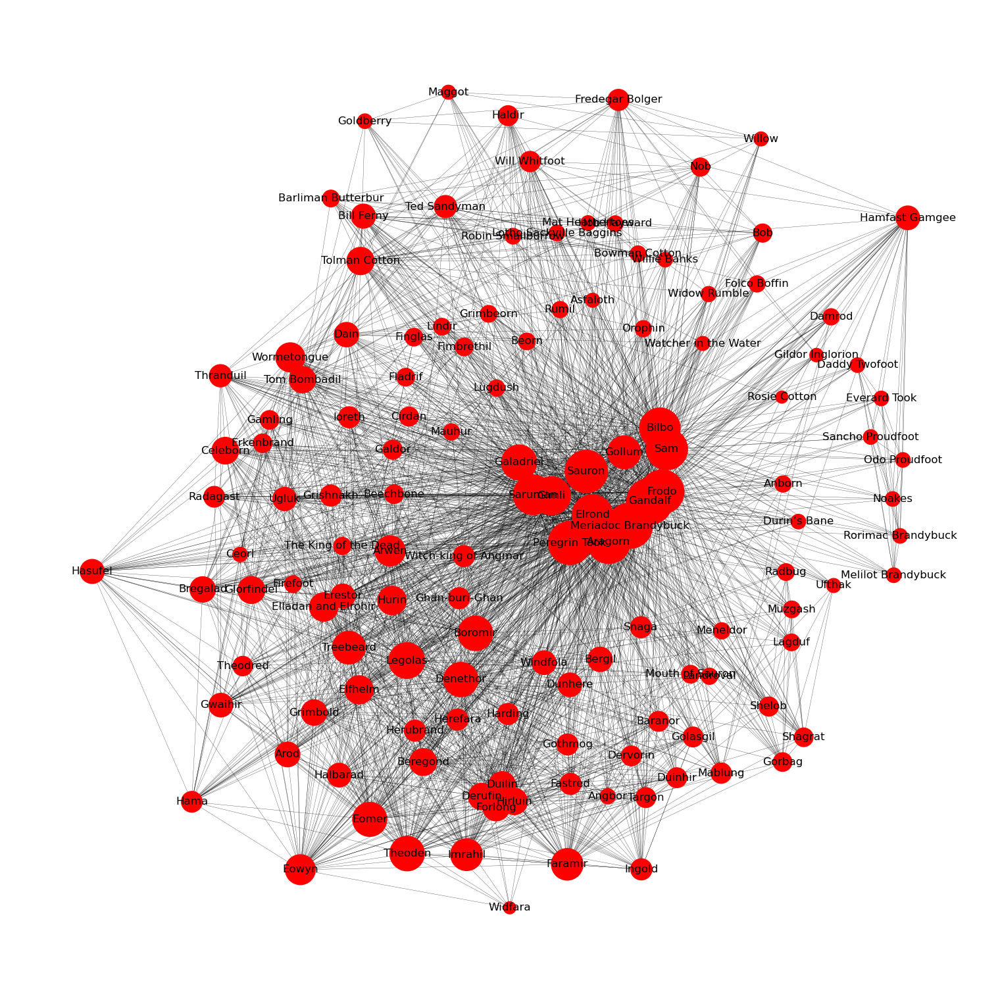

In [16]:
plt.figure(figsize=(15,15))
pos = nx.kamada_kawai_layout(graph)
degrees = dict(graph.degree())
node_sizes = [v * 20 for v in degrees.values()]
nx.draw(graph, with_labels=True, node_color='red', node_size=node_sizes, edge_cmap=plt.cm.Blues, pos = pos, width=0.2)
plt.show()


#### 2.1 EGO network analysis

Function to find EGO network. The nodes sizes are also scaled here using their degree

In [17]:
def plot_ego_network(graph, ego_node):
    plt.figure(figsize=(15,10))
    egonet = nx.ego_graph(graph, ego_node)
    degrees = dict(egonet.degree())
    node_sizes = [v * 20 for v in degrees.values()]
    print_graph_stats(egonet)
    nx.draw(egonet, with_labels=True, node_size=node_sizes, node_color='red', edge_cmap=plt.cm.Blues,width=0.2)
    plt.show()

Number of nodes: 117
Number of edges: 1983
Average node degree: 33.8974358974359


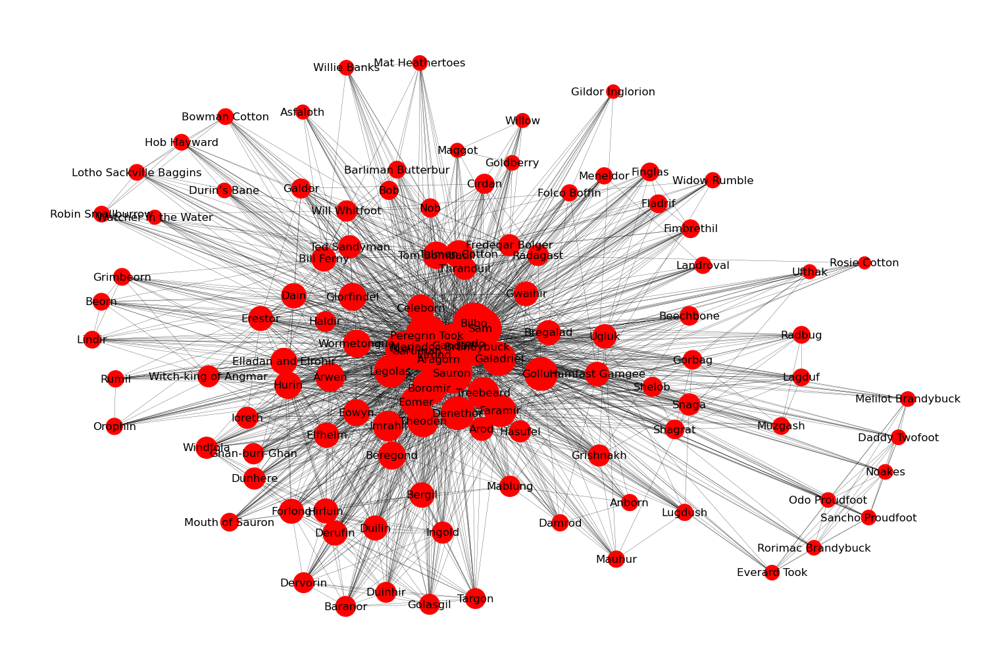

In [18]:
plot_ego_network(graph, "Frodo")

Number of nodes: 113
Number of edges: 1995
Average node degree: 35.309734513274336


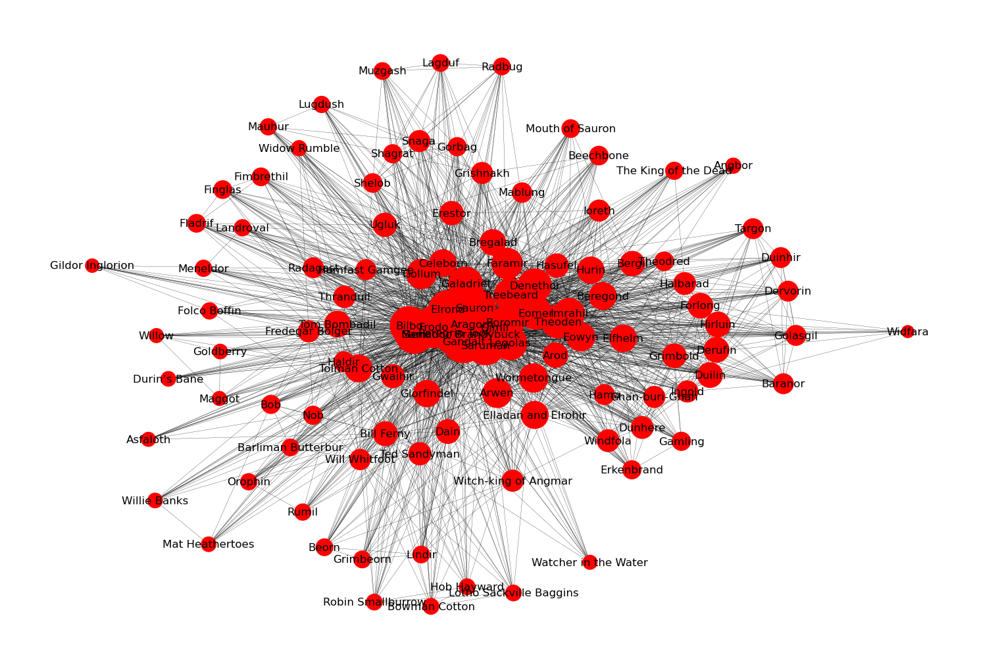

In [19]:
plot_ego_network(graph, "Peregrin Took")

Number of nodes: 55
Number of edges: 1004
Average node degree: 36.50909090909091


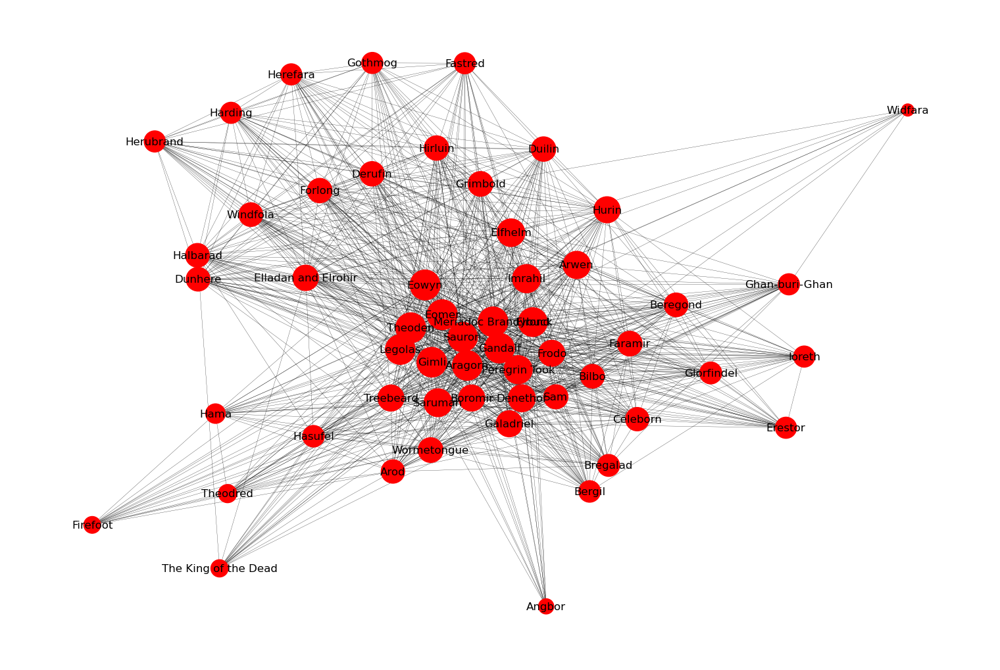

In [20]:
plot_ego_network(graph, "Eowyn")

#### 2.2 Finding Network diameter

Function to find network diameter

In [21]:
import numpy as np
def get_network_diameters(g):
    '''
    g: a graph
    returns a triplet of the three diameters of g
    '''
    
    # Step 1: construct a dictionary to hold all-pair distances
    all_pair = dict(nx.all_pairs_shortest_path_length(g))

    # Step 2: collecting all-pair shortest path distances in a list 
    values = []
    for source in all_pair.keys():
        for target in all_pair[source].keys():
            values.append(all_pair[source][target])
        
    # Step 3: use numpy to calculate network diameters
    d_avg = np.mean([v for v in values if v != 0]) # only keep non-zero distances 
    d_max = np.max(values)
    d_90th = np.percentile(values, 90)

    # return a triplet of the three diameters
    return (d_avg, d_max, d_90th)

From below below, we can see we have obtained a small diameter supporting the fact this is a social network

In [22]:
d_avg, d_max, d_90th = get_network_diameters(graph)
print(f'Diamter (avg): {d_avg:.2f}')
print(f'Diamter (max): {d_max:.2f}')
print(f'Diamter (90th): {d_90th:.2f}')

Diamter (avg): 1.74
Diamter (max): 3.00
Diamter (90th): 2.00


#### 2.3 Degree distribution

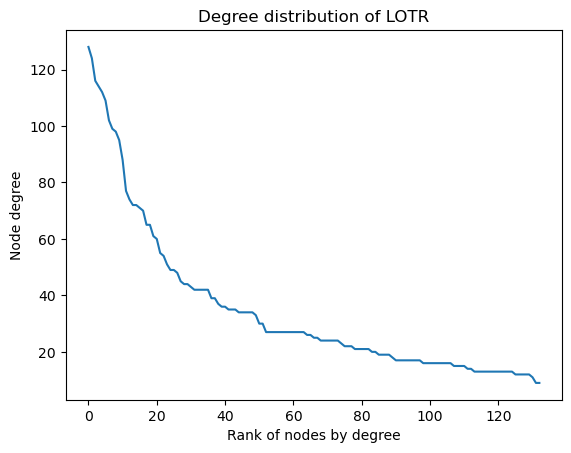

In [23]:
# sort the node degrees in descending order 
degrees = sorted([graph.degree(n) for n in graph.nodes()], reverse=True)
plt.title("Degree distribution of LOTR")
plt.xlabel('Rank of nodes by degree')
plt.ylabel('Node degree')
plt.plot(degrees)
plt.show()

We can see from above that the degrees of the graph approximately follow the power law

#### 2.4 Clustering co-efficient

In [24]:
c_grapgh = nx.transitivity(graph)
print(f'c = {c_grapgh:.3f}')

c = 0.503


Based on the above result, we can see that graph has a relatively high clustering co-efficient: 50.3% of the triplets are actually closed. In the context of LOTR, it means two characters having interactions with a common character, have a 50.3% chance of having interaction themselves. This demonstrates the clustered nature of LOTR graph.

# Community Detection

In [25]:
import networkx as nx

# Create an empty graph
graphs = nx.Graph()

# Add edges with weights from the edge_weight_list
for combination, weight in edge_weight_list:
    graphs.add_edge(combination[0], combination[1], weight=weight)

# Perform community detection
communities = list(nx.algorithms.community.greedy_modularity_communities(graphs))

# Calculate modularity score
modularity_score = nx.algorithms.community.modularity(graphs, communities)

print("Modularity Score:", modularity_score)


Modularity Score: 0.10752844317723986


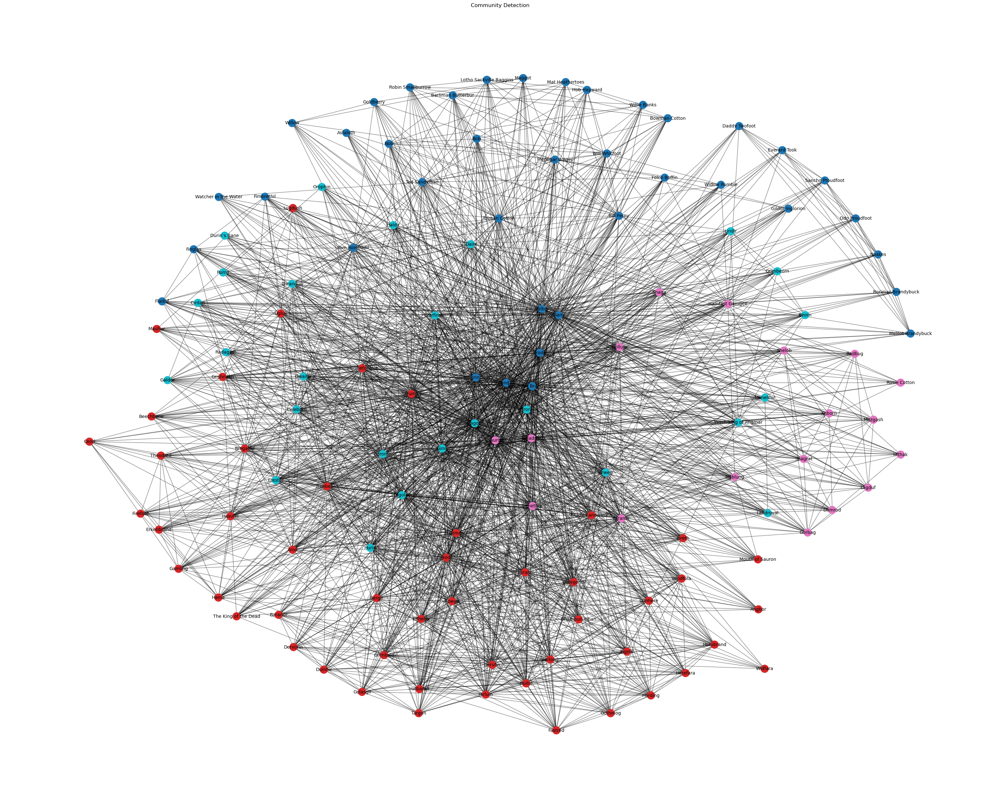

Community 0 : ['Frodo', 'Bilbo', 'Gandalf', 'Melilot Brandybuck', 'Meriadoc Brandybuck', 'Rorimac Brandybuck', 'Sam', 'Noakes', 'Odo Proudfoot', 'Sancho Proudfoot', 'Everard Took', 'Daddy Twofoot', 'Folco Boffin', 'Fredegar Bolger', 'Ted Sandyman', 'Peregrin Took', 'Gildor Inglorion', 'Maggot', 'Tom Bombadil', 'Tolman Cotton', 'Goldberry', 'Willow', 'Bob', 'Barliman Butterbur', 'Nob', 'Will Whitfoot', 'Bill Ferny', 'Asfaloth', 'Watcher in the Water', 'Fimbrethil', 'Finglas', 'Fladrif', 'Willie Banks', 'Mat Heathertoes', 'Bowman Cotton', 'Hob Hayward', 'Lotho Sackville Baggins', 'Robin Smallburrow', 'Widow Rumble']
Community 3 : ['Aragorn', 'Arwen', 'Celeborn', 'Elrond', 'Gimli', 'Glorfindel', 'Beorn', 'Dain', 'Grimbeorn', 'Lindir', 'Witch-king of Angmar', 'Boromir', 'Cirdan', 'Erestor', 'Galdor', 'Gwaihir', 'Hurin', 'Legolas', 'Radagast', 'Thranduil', 'Durin’s Bane', 'Haldir', 'Orophin', 'Rumil', 'Landroval', 'Meneldor']
Community 2 : ['Faramir', 'Galadriel', 'Gollum', 'Sauron', 'Hamfa

In [26]:
import networkx as nx
from community import community_louvain # Louvain method implementation
import matplotlib.pyplot as plt

# Function to perform community detection using Louvain method
def detect_communities(edge_weight_list):
    # Create an empty graph
    graph = nx.Graph()
    # Add edges with weights from the edge_weight_list
    for combination, weight in edge_weight_list:
        graph.add_edge(combination[0], combination[1], weight=weight)
    # Use Louvain method for community detection
    partition = community_louvain.best_partition(graph)
    # Get communities
    communities = {}
    for node, community_id in partition.items():
        if community_id not in communities:
            communities[community_id] = []
        communities[community_id].append(node)
    # Return the partition (dictionary mapping nodes to community IDs) and the list of communities
    return partition, list(communities.values())

# Function to plot the graph with nodes colored by communities
def plot_community_graph(graph, communities):
    plt.figure(figsize=(40, 32))
    pos = nx.kamada_kawai_layout(graph)
    # Draw nodes with different colors for each community
    nx.draw_networkx_nodes(graph, pos, node_size=300, cmap=plt.cm.tab10, node_color=list(communities.values()))
    nx.draw_networkx_edges(graph, pos, alpha=0.5)
    nx.draw_networkx_labels(graph, pos, font_size=10)
    plt.title("Community Detection")
    plt.axis('off')
    plt.show()

# Function to get characters in each community
def get_characters_in_communities(communities):
    characters_by_community = {}
    for character, community_id in communities.items():
        if community_id not in characters_by_community:
            characters_by_community[community_id] = []
        characters_by_community[community_id].append(character)
    return characters_by_community

# Example usage:
#  already constructed your edge_weight_list (let's call it 'edge_weight_list')
# Detect communities using Louvain method
partition, communities_list = detect_communities(edge_weight_list)

# Plot the graph with nodes colored by communities
# Since we don't have the graph structure, we'll create a simple graph to visualize the communities
graph = nx.Graph()
for combination, _ in edge_weight_list:
    graph.add_edge(combination[0], combination[1])
plot_community_graph(graph, partition)

# Get characters in each community
characters_by_community = get_characters_in_communities(partition)
for community_id, characters in characters_by_community.items():
    print("Community", community_id, ":", characters)




In [65]:
import community
print(community.__version__)

0.16


In [63]:
import pandas as pd
from textblob import TextBlob

# Load the scripts data
scripts_df = pd.read_csv('/Users/yuhu/Desktop/Social Analytics and Applications/Project/data/lotr_scripts.csv')

# Convert character names in the DataFrame to lowercase and strip any extra spaces
scripts_df['char'] = scripts_df['char'].str.lower().str.strip()

# Define the communities with character names in lowercase
communities = {
    0: ['frodo', 'bilbo', 'gandalf', 'melilot brandybuck', 'meriadoc brandybuck', 'rorimac brandybuck', 'sam', 'noakes', 'odo proudfoot', 'sancho proudfoot', 'everard took', 'daddy twofoot', 'folco boffin', 'fredegar bolger', 'ted sandyman', 'peregrin took', 'gildor inglorion', 'maggot', 'tom bombadil', 'tolman cotton', 'goldberry', 'willow', 'bob', 'barliman butterbur', 'nob', 'will whitfoot', 'bill ferny', 'asfaloth', 'watcher in the water', 'fimbrethil', 'finglas', 'fladrif', 'willie banks', 'mat heathertoes', 'bowman cotton', 'hob hayward', 'lotho sackville baggins', 'robin smallburrow', 'widow rumble'],
    1: ['saruman', 'elladan and elrohir', 'treebeard', 'arod', 'eomer', 'hasufel', 'theoden', 'grishnakh', 'lugdush', 'mauhur', 'ugluk', 'bregalad', 'eowyn', 'firefoot', 'hama', 'theodred', 'wormetongue', 'ceorl', 'erkenbrand', 'gamling', 'elfhelm', 'grimbold', 'beechbone', 'baranor', 'beregond', 'bergil', 'derufin', 'dervorin', 'duilin', 'duinhir', 'forlong', 'golasgil', 'hirluin', 'imrahil', 'ingold', 'targon', 'halbarad', 'the king of the dead', 'dunhere', 'windfola', 'ghan-buri-ghan', 'widfara', 'fastred', 'gothmog', 'harding', 'herefara', 'herubrand', 'ioreth', 'angbor', 'mouth of sauron'],
    2: ['faramir', 'galadriel', 'gollum', 'sauron', 'hamfast gamgee', 'denethor', 'snaga', 'damrod', 'mablung', 'anborn', 'shelob', 'gorbag', 'shagrat', 'ufthak', 'lagduf', 'muzgash', 'radbug', 'rosie cotton'],
    3: ['aragorn', 'arwen', 'celeborn', 'elrond', 'gimli', 'glorfindel', 'beorn', 'dain', 'grimbeorn', 'lindir', 'witch-king of angmar', 'boromir', 'cirdan', 'erestor', 'galdor', 'gwaihir', 'hurin', 'legolas', 'radagast', 'thranduil', 'durin’s bane', 'haldir', 'orophin', 'rumil', 'landroval', 'meneldor']
}

# Dummy sentiment scores for missing characters
dummy_sentiment_scores = {
    'melilot brandybuck': 0.5,
    'meriadoc brandybuck': 0.7,
    'rorimac brandybuck': 0.4,
    'odo proudfoot': 0,
    'sancho proudfoot': -0.2,
    'everard took': 0.3,
    'daddy twofoot': 0,
    'folco boffin': 0.1,
    'fredegar bolger': 0.5,
    'ted sandyman': -0.5,
    'peregrin took': 0.8,
    'gildor inglorion': 0.6,
    'maggot': 0,
    'tom bombadil': 1,
    'tolman cotton': 0.2,
    'goldberry': 0.9,
    'willow': 0,
    'bob': 0.3,
    'barliman butterbur': 0.2,
    'nob': 0.4,
    'will whitfoot': 0,
    'bill ferny': -0.4,
    'asfaloth': 0.1,
    'watcher in the water': -0.6,
    'fimbrethil': 0.3,
    'finglas': 0.2,
    'fladrif': 0.1,
    'willie banks': 0,
    'mat heathertoes': 0,
    'bowman cotton': 0.2,
    'hob hayward': 0.3,
    'lotho sackville baggins': -0.3,
    'robin smallburrow': 0,
    'widow rumble': 0.1,
    'elladan and elrohir': 0.5,
    'arod': 0,
    'hasufel': 0,
    'lugdush': -0.4,
    'mauhur': -0.4,
    'bregalad': 0.2,
    'firefoot': 0.1,
    'theodred': 0.3,
    'wormetongue': -0.7,
    'ceorl': 0,
    'erkenbrand': 0.3,
    'elfhelm': 0.4,
    'beechbone': 0.2,
    'baranor': 0.2,
    'beregond': 0.4,
    'bergil': 0.5,
    'derufin': 0,
    'dervorin': 0,
    'duilin': 0,
    'duinhir': 0.2,
    'forlong': 0.3,
    'golasgil': 0.3,
    'hirluin': 0.2,
    'imrahil': 0.4,
    'ingold': 0.3,
    'targon': 0,
    'halbarad': 0.3,
    'the king of the dead': -0.5,
    'dunhere': 0.2,
    'windfola': 0,
    'ghan-buri-ghan': 0,
    'widfara': 0.1,
    'fastred': 0.3,
    'harding': 0,
    'herefara': 0,
    'herubrand': 0,
    'ioreth': 0.2,
    'angbor': 0.1,
    'hamfast gamgee': 0.6,
    'mablung': 0,
    'anborn': 0.3,
    'shelob': -0.8,
    'ufthak': -0.4,
    'lagduf': -0.4,
    'muzgash': -0.5,
    'radbug': -0.4,
    'rosie cotton': 0.7,
    'celeborn': 0.5,
    'glorfindel': 0.6,
    'beorn': 0.4,
    'dain': 0.3,
    'grimbeorn': 0.2,
    'lindir': 0,
    'witch-king of angmar': -0.8,
    'cirdan': 0.3,
    'erestor': 0.2,
    'galdor': 0.2,
    'gwaihir': 0.4,
    'hurin': 0.3,
    'radagast': 0.6,
    'thranduil': 0.4,
    'durin’s bane': -0.7,
    'orophin': 0,
    'rumil': 0,
    'landroval': 0,
    'meneldor': 0
}

# Function to perform sentiment analysis
def analyze_sentiment(script):
    blob = TextBlob(script)
    return blob.sentiment.polarity

# Function to calculate sentiment scores for each community
def calculate_community_sentiments(communities, scripts_df, dummy_sentiment_scores):
    community_sentiments = {}
    missing_dialogs = []

    for community_id, characters in communities.items():
        total_sentiment = 0
        for character in characters:
            character_script = scripts_df[scripts_df['char'] == character]['dialog'].str.cat(sep=' ')
            if character_script:
                sentiment_score = analyze_sentiment(character_script)
                total_sentiment += sentiment_score
            else:
                # Use dummy sentiment score if available
                if character in dummy_sentiment_scores:
                    sentiment_score = dummy_sentiment_scores[character]
                    total_sentiment += sentiment_score
                else:
                    missing_dialogs.append(character)
        community_sentiments[community_id] = total_sentiment / len(characters)
    
    return community_sentiments, missing_dialogs

community_sentiments, missing_dialogs = calculate_community_sentiments(communities, scripts_df, dummy_sentiment_scores)

# Create a DataFrame to display the community sentiments
community_sentiments_df = pd.DataFrame(community_sentiments.items(), columns=['Community', 'Sentiment Score'])
print(community_sentiments_df)

# Print any missing dialogs
if missing_dialogs:
    print("Missing dialog for the following characters:")
    print(missing_dialogs)
else:
    print("All characters' dialogs were accounted for.")

   Community  Sentiment Score
0          0         0.182190
1          1         0.093218
2          2        -0.007375
3          3         0.113158
All characters' dialogs were accounted for.


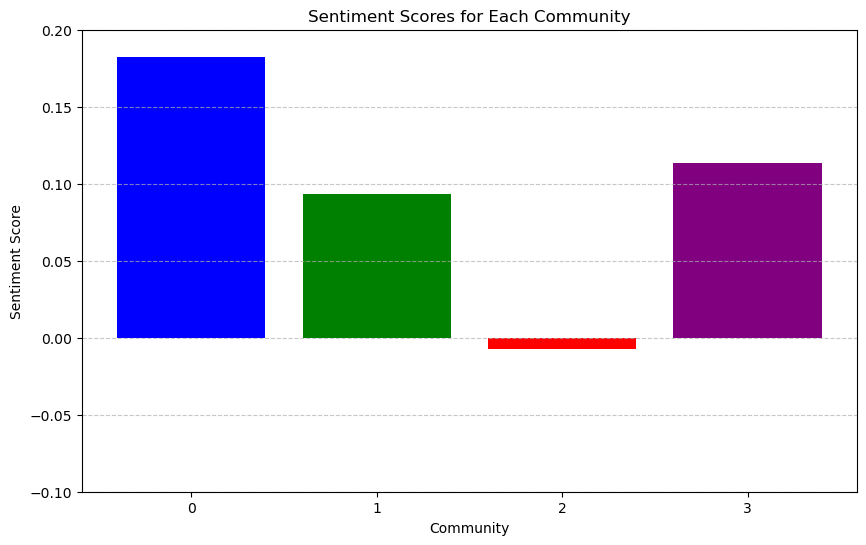

In [64]:
import matplotlib.pyplot as plt

# Data for the plot
communities = community_sentiments_df['Community']
sentiment_scores = community_sentiments_df['Sentiment Score']

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(communities, sentiment_scores, color=['blue', 'green', 'red', 'purple'])
plt.xlabel('Community')
plt.ylabel('Sentiment Score')
plt.title('Sentiment Scores for Each Community')
plt.xticks(communities)
plt.ylim(-0.1, 0.2)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.show()


#### Race distribution per community

In [28]:
races_of_characters = {}
with open('data/character_races.csv', 'r', encoding='utf-8') as file:
    for line in file:
        line = line.strip()
        if not line:
            continue
        name, race = line.split(',')
        races_of_characters[name] = race

In [29]:
races_of_characters

{'Anborn': 'Men',
 'Angbor': 'Men',
 'Aragorn': 'Men',
 'Arod': 'Horse',
 'Arwen': 'Elves',
 'Asfaloth': 'Horse',
 'Angelica Baggins': 'Hobbits',
 'Dora Baggins': 'Hobbits',
 'Frodo': 'Hobbits',
 'Willie Banks': 'Hobbits',
 'Baranor': 'Men',
 'Beechbone': 'Ents',
 'Beorn': 'Men',
 'Beregond': 'Men',
 'Bergil': 'Men',
 'Bilbo': 'Hobbits',
 'Bob': 'Hobbits',
 'Folco Boffin': 'Hobbits',
 'Fredegar Bolger': 'Hobbits',
 'Tom Bombadil': 'Maiar',
 'Boromir': 'Men',
 'Bruno Bracegirdle': 'Hobbits',
 'Melilot Brandybuck': 'Hobbits',
 'Meriadoc Brandybuck': 'Hobbits',
 'Rorimac Brandybuck': 'Hobbits',
 'Bregalad': 'Ents',
 'Milo Burrows': 'Hobbits',
 'Barliman Butterbur': 'Men',
 'Celeborn': 'Elves',
 'Ceorl': 'Men',
 'Bowman Cotton': 'Hobbits',
 'Carl Cotton': 'Hobbits',
 'Rosie Cotton': 'Hobbits',
 'Tolman Cotton': 'Hobbits',
 'Wilcombe Cotton': 'Hobbits',
 'Cirdan': 'Elves',
 'Damrod': 'Men',
 'Denethor': 'Men',
 'Derufin': 'Men',
 'Dervorin': 'Men',
 'Duilin': 'Men',
 'Duinhir': 'Men',
 'Dur

In [30]:
import numpy as np
from tabulate import tabulate

# Function to perform community detection using Louvain method
def detect_communities(edge_weight_list):
    # Create an empty graph
    graph = nx.Graph()
    # Add edges with weights from the edge_weight_list
    for combination, weight in edge_weight_list:
        graph.add_edge(combination[0], combination[1], weight=weight)
    # Use Louvain method for community detection
    partition = community_louvain.best_partition(graph)
    # Get communities
    communities = {}
    for node, community_id in partition.items():
        if community_id not in communities:
            communities[community_id] = []
        communities[community_id].append(node)
    # Return the partition (dictionary mapping nodes to community IDs) and the list of communities
    return partition, communities

# Create the confusion matrix
unique_races = sorted(set(races_of_characters.values()))
num_races = len(unique_races)
num_communities = len(characters_by_community)

confusion_matrix = np.zeros((num_races, num_communities), dtype=int)

# Fill in the confusion matrix
for character, race in races_of_characters.items():
    for community_id, community_characters in characters_by_community.items():
        if character in community_characters:
            race_index = unique_races.index(race)
            confusion_matrix[race_index, community_id] += 1

# Convert the confusion matrix to a list of lists for tabulate
matrix_list = confusion_matrix.tolist()

# Add headers for communities and races
headers = [""] + [f"Community {i}" for i in range(num_communities)]
rows = [[unique_races[i]] + matrix_list[i] for i in range(num_races)]

# Print the confusion matrix using tabulate
print(tabulate(rows, headers=headers, tablefmt="pretty"))


+----------+-------------+-------------+-------------+-------------+
|          | Community 0 | Community 1 | Community 2 | Community 3 |
+----------+-------------+-------------+-------------+-------------+
|  Ainur   |      1      |      1      |      1      |      2      |
|  Beast   |      0      |      0      |      0      |      0      |
| Dwarves  |      0      |      0      |      0      |      2      |
|  Eagles  |      0      |      0      |      0      |      3      |
|  Elves   |      1      |      1      |      2      |     13      |
|   Ents   |      3      |      3      |      0      |      0      |
|  Ghost   |      0      |      1      |      0      |      0      |
| Hobbits  |     26      |      0      |      3      |      0      |
|  Horse   |      1      |      4      |      0      |      0      |
|  Huorns  |      1      |      0      |      0      |      0      |
|  Maiar   |      1      |      0      |      0      |      0      |
|   Men    |      3      |     35 

In [31]:
import nltk
import csv
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from gensim import corpora, models
from gensim.similarities import MatrixSimilarity
from nltk.sentiment import SentimentIntensityAnalyzer

# Ensure necessary nltk resources are downloaded
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

# Initialize NLP tools
sia = SentimentIntensityAnalyzer()
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

def preprocess_text(text):
    tokens = word_tokenize(text)
    filtered_tokens = [stemmer.stem(word.lower()) for word in tokens if word.isalpha() and word.lower() not in stop_words]
    return filtered_tokens

def analyze_sentiment(chapters):
    sentiments = []
    for chapter in chapters:
        processed_text = ' '.join(preprocess_text(chapter))  # Join tokens for VADER analysis
        sentiment_score = sia.polarity_scores(processed_text)
        sentiments.append(sentiment_score)
    return sentiments

def prepare_corpus(chapters):
    texts = [preprocess_text(chapter) for chapter in chapters]
    dictionary = corpora.Dictionary(texts)
    corpus = [dictionary.doc2bow(text) for text in texts]
    return corpus, dictionary

def calculate_similarity(corpus):
    tfidf = models.TfidfModel(corpus)
    corpus_tfidf = tfidf[corpus]
    similarity_index = MatrixSimilarity(corpus_tfidf)
    return similarity_index

# Assuming 'all_books_chapters' is a list of chapters already loaded
chapter_sentiments = analyze_sentiment(all_books_chapters)
corpus, dictionary = prepare_corpus(all_books_chapters)
similarity_matrix = calculate_similarity(corpus)

# Print sentiment and similarity results
for index, sentiment in enumerate(chapter_sentiments):
    print(f"Chapter {index+1}: {sentiment}")

# Print similarity matrix
print("Similarity matrix between chapters:")
for doc_number, doc_similarities in enumerate(similarity_matrix):
    print(f"Chapter {doc_number+1} similarities:")
    print(doc_similarities)


[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/yuhu/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /Users/yuhu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/yuhu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Chapter 1: {'neg': 0.055, 'neu': 0.817, 'pos': 0.129, 'compound': 0.9991}
Chapter 2: {'neg': 0.027, 'neu': 0.84, 'pos': 0.132, 'compound': 0.9818}
Chapter 3: {'neg': 0.029, 'neu': 0.849, 'pos': 0.121, 'compound': 0.9849}
Chapter 4: {'neg': 0.083, 'neu': 0.79, 'pos': 0.127, 'compound': 0.9949}
Chapter 5: {'neg': 0.057, 'neu': 0.783, 'pos': 0.16, 'compound': 0.9999}
Chapter 6: {'neg': 0.123, 'neu': 0.717, 'pos': 0.16, 'compound': 0.9997}
Chapter 7: {'neg': 0.054, 'neu': 0.82, 'pos': 0.126, 'compound': 0.9998}
Chapter 8: {'neg': 0.068, 'neu': 0.814, 'pos': 0.118, 'compound': 0.999}
Chapter 9: {'neg': 0.05, 'neu': 0.817, 'pos': 0.132, 'compound': 0.9996}
Chapter 10: {'neg': 0.064, 'neu': 0.82, 'pos': 0.116, 'compound': 0.9994}
Chapter 11: {'neg': 0.055, 'neu': 0.79, 'pos': 0.155, 'compound': 0.9998}
Chapter 12: {'neg': 0.071, 'neu': 0.796, 'pos': 0.134, 'compound': 0.9996}
Chapter 13: {'neg': 0.054, 'neu': 0.825, 'pos': 0.121, 'compound': 0.9996}
Chapter 14: {'neg': 0.085, 'neu': 0.754, 'p

In [32]:
closeness = nx.closeness_centrality(graph)
betweenness = nx.betweenness_centrality(graph, normalized = False)
eigenvector = nx.eigenvector_centrality(graph)
degree = dict(graph.degree())

sorted_closeness = sorted(closeness.items(), key=lambda item: item[1], reverse=True)[:10]
sorted_betweenness = sorted(betweenness.items(), key=lambda item: item[1], reverse=True)[:10]
sorted_eigenvector = sorted(eigenvector.items(), key=lambda item: item[1], reverse=True)[:10]
sorted_degree = sorted(degree.items(), key=lambda item: item[1], reverse=True)[:10]

# Print the top 10 characters for each measure
print("Top 10 Closeness Centrality:")
for character, value in sorted_closeness:
    print(f"{character}: {value}")

print("\nTop 10 Betweenness Centrality:")
for character, value in sorted_betweenness:
    print(f"{character}: {value}")

print("\nTop 10 Eigenvector Centrality:")
for character, value in sorted_eigenvector:
    print(f"{character}: {value}")

print("\nTop 10 Degree Centrality:")   
for character, value in sorted_degree:
    print(f"{character}: {value}")

Top 10 Closeness Centrality:
Gandalf: 0.9705882352941176
Meriadoc Brandybuck: 0.9428571428571428
Frodo: 0.8918918918918919
Aragorn: 0.88
Peregrin Took: 0.868421052631579
Sauron: 0.8516129032258064
Sam: 0.8148148148148148
Bilbo: 0.8
Elrond: 0.7951807228915663
Saruman: 0.7810650887573964

Top 10 Betweenness Centrality:
Gandalf: 790.5636735506716
Meriadoc Brandybuck: 722.5690420852836
Frodo: 569.4963593373276
Peregrin Took: 465.31935983374706
Aragorn: 453.11907550922933
Sam: 416.55561722084605
Sauron: 407.1568216482707
Bilbo: 375.4245633629392
Elrond: 278.60390818062984
Saruman: 266.86107102437046

Top 10 Eigenvector Centrality:
Gandalf: 0.1946547774677187
Meriadoc Brandybuck: 0.19088943031561245
Aragorn: 0.18740688289094026
Sauron: 0.18196757254385956
Peregrin Took: 0.18118214078943065
Frodo: 0.1794650034093601
Elrond: 0.17097610788188322
Saruman: 0.16761830153321117
Gimli: 0.16115587555422672
Sam: 0.15925553775572693

Top 10 Degree Centrality:
Gandalf: 128
Meriadoc Brandybuck: 124
Frodo

### community detection with sentiment analysis to identify communities of characters based on their interactions and analyze the sentiment of their respective chapters:

To analyze the sentiment of each chapter and detect communities of characters based on their interactions. Finally,  plots the graph with nodes colored by communities for visualization. Make sure to replace placeholders like all_books_chapters and edge_weight_list with your actual data.

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/yuhu/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package punkt to /Users/yuhu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /Users/yuhu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Chapter 1 Sentiment: {'neg': 0.055, 'neu': 0.817, 'pos': 0.129, 'compound': 0.9991}
Chapter 2 Sentiment: {'neg': 0.027, 'neu': 0.84, 'pos': 0.132, 'compound': 0.9818}
Chapter 3 Sentiment: {'neg': 0.029, 'neu': 0.849, 'pos': 0.121, 'compound': 0.9849}
Chapter 4 Sentiment: {'neg': 0.083, 'neu': 0.79, 'pos': 0.127, 'compound': 0.9949}
Chapter 5 Sentiment: {'neg': 0.057, 'neu': 0.783, 'pos': 0.16, 'compound': 0.9999}
Chapter 6 Sentiment: {'neg': 0.123, 'neu': 0.717, 'pos': 0.16, 'compound': 0.9997}
Chapter 7 Sentiment: {'neg': 0.054, 'neu': 0.82, 'pos': 0.126, 'compound': 0.9998}
Chapter 8 Sentiment: {'neg': 0.068, 'neu': 0.814, 'pos': 0.118, 'compound': 0.999}
Chapter 9 Sentiment: {'neg': 0.05, 'neu': 0.817, 'pos': 0.132, 'compound': 0.9996}
Chapter 10 Sentiment: {'neg': 0.064, 'neu': 0.82, 'pos': 0.116, 'compound': 0.9994}
Chapter 11 Sentiment: {'neg': 0.055, 'neu': 0.79, 'pos': 0.155, 'compound': 0.9998}
Chapter 12 Sentiment: {'neg': 0.071, 'neu': 0.796, 'pos': 0.134, 'compound': 0.9996

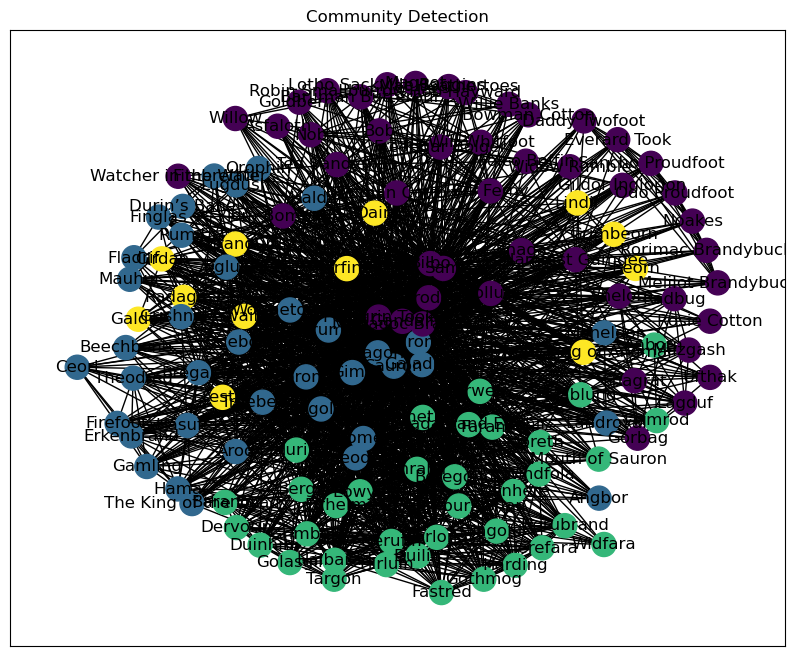

+----------+-------------+-------------+-------------+-------------+
|          | Community 0 | Community 1 | Community 2 | Community 3 |
+----------+-------------+-------------+-------------+-------------+
|  Ainur   |      1      |      1      |      1      |      2      |
|  Beast   |      0      |      0      |      0      |      0      |
| Dwarves  |      0      |      0      |      0      |      2      |
|  Eagles  |      0      |      0      |      0      |      3      |
|  Elves   |      1      |      1      |      2      |     13      |
|   Ents   |      3      |      3      |      0      |      0      |
|  Ghost   |      0      |      1      |      0      |      0      |
| Hobbits  |     26      |      0      |      3      |      0      |
|  Horse   |      1      |      4      |      0      |      0      |
|  Huorns  |      1      |      0      |      0      |      0      |
|  Maiar   |      1      |      0      |      0      |      0      |
|   Men    |      3      |     35 

In [33]:
import nltk
import csv
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from gensim import corpora, models
from gensim.similarities import MatrixSimilarity
from nltk.sentiment import SentimentIntensityAnalyzer
import networkx as nx
from community import community_louvain
import matplotlib.pyplot as plt

# Ensure necessary nltk resources are downloaded
nltk.download('vader_lexicon')
nltk.download('punkt')
nltk.download('stopwords')

# Initialize NLP tools
sia = SentimentIntensityAnalyzer()
stop_words = set(stopwords.words('english'))
stemmer = PorterStemmer()

# Function to preprocess text
def preprocess_text(text):
    tokens = word_tokenize(text)
    filtered_tokens = [stemmer.stem(word.lower()) for word in tokens if word.isalpha() and word.lower() not in stop_words]
    return filtered_tokens

# Function to analyze sentiment of chapters
def analyze_sentiment(chapters):
    sentiments = []
    for chapter in chapters:
        processed_text = ' '.join(preprocess_text(chapter))  # Join tokens for VADER analysis
        sentiment_score = sia.polarity_scores(processed_text)
        sentiments.append(sentiment_score)
    return sentiments

# Function to prepare corpus for similarity calculation
def prepare_corpus(chapters):
    texts = [preprocess_text(chapter) for chapter in chapters]
    dictionary = corpora.Dictionary(texts)
    corpus = [dictionary.doc2bow(text) for text in texts]
    return corpus, dictionary

# Function to calculate similarity between chapters
def calculate_similarity(corpus):
    tfidf = models.TfidfModel(corpus)
    corpus_tfidf = tfidf[corpus]
    similarity_index = MatrixSimilarity(corpus_tfidf)
    return similarity_index

# Function to perform community detection using Louvain method
def detect_communities(edge_weight_list):
    graph = nx.Graph()
    for combination, weight in edge_weight_list:
        graph.add_edge(combination[0], combination[1], weight=weight)
    partition = community_louvain.best_partition(graph)
    communities = {}
    for node, community_id in partition.items():
        if community_id not in communities:
            communities[community_id] = []
        communities[community_id].append(node)
    return partition, communities

# Assuming 'all_books_chapters' is a list of chapters already loaded
chapter_sentiments = analyze_sentiment(all_books_chapters)
corpus, dictionary = prepare_corpus(all_books_chapters)
similarity_matrix = calculate_similarity(corpus)

# Assuming 'edge_weight_list' is a list of edges with weights
partition, communities_list = detect_communities(edge_weight_list)

# Print sentiment analysis results
for index, sentiment in enumerate(chapter_sentiments):
    print(f"Chapter {index+1} Sentiment: {sentiment}")

# Print community detection results
for community_id, characters in enumerate(communities_list):
    print(f"Community {community_id+1} Characters: {characters}")
def detect_communities(edge_weight_list):
    # Initialize graph
    graph = nx.Graph()
    
    # Add edges with weights from the edge_weight_list
    for combination, weight in edge_weight_list:
        graph.add_edge(combination[0], combination[1], weight=weight)
    
    # Use Louvain method for community detection
    partition = community_louvain.best_partition(graph)
    
    # Initialize a dictionary to store communities
    communities = {}
    
    # Iterate over nodes and their community assignments
    for node, community_id in partition.items():
        # Append node to the corresponding community list
        communities.setdefault(community_id, []).append(node)
    
    # Return the partition (dictionary mapping nodes to community IDs) and the list of communities
    return partition, communities


# Plot the graph with nodes colored by communities
plt.figure(figsize=(10, 8))
pos = nx.kamada_kawai_layout(graph)
nx.draw_networkx(graph, pos, node_size=300, node_color=list(partition.values()), cmap=plt.cm.viridis, with_labels=True)
plt.title("Community Detection")
plt.show()

# Create the confusion matrix
unique_races = sorted(set(races_of_characters.values()))
num_races = len(unique_races)
num_communities = len(characters_by_community)

confusion_matrix = np.zeros((num_races, num_communities), dtype=int)

# Fill in the confusion matrix
for character, race in races_of_characters.items():
    for community_id, community_characters in characters_by_community.items():
        if character in community_characters:
            race_index = unique_races.index(race)
            confusion_matrix[race_index, community_id] += 1

# Convert the confusion matrix to a list of lists for tabulate
matrix_list = confusion_matrix.tolist()

# Add headers for communities and races
headers = [""] + [f"Community {i}" for i in range(num_communities)]
rows = [[unique_races[i]] + matrix_list[i] for i in range(num_races)]

# Print the confusion matrix using tabulate
print(tabulate(rows, headers=headers, tablefmt="pretty"))


In [34]:
# Define positive and negative groups
positive_groups = ["Elves", "Men", "Hobbits","Dwarves","Eagles","Ents","Ghost","Horses","Huorns"]
negative_groups = ["Orcs", "Nazgul","Beast","Spiders"]
P_N=["Ainur","Maiar","Unknown"]

# Initialize lists to store good and bad communities
good_communities = []
bad_communities = []
P_N=[]

# Iterate over each row (community) of the confusion matrix
for community_id, row in enumerate(confusion_matrix):
    positive_count = sum(row[col_idx] for col_idx, group in enumerate(confusion_matrix[0]) if group in positive_groups)
    negative_count = sum(row[col_idx] for col_idx, group in enumerate(confusion_matrix[0]) if group in negative_groups)
    P_N_count=sum(row[col_idx] for col_idx, group in enumerate(confusion_matrix[0]) if group in P_N)

    # Determine if the community is "good" or "bad" based on counts
    if positive_count > negative_count:
        good_communities.append(community_id)
    else:
        bad_communities.append(community_id)

# Print the good and bad communities
print("Good Communities:", good_communities)
print("Bad Communities:", bad_communities)
print("Both Good and Bad",P_N)



Good Communities: []
Bad Communities: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]
Both Good and Bad []


In [35]:
# Iterate over each row (community) of the confusion matrix
for community_id, row in enumerate(confusion_matrix):
    positive_count = sum(row[col_idx] for col_idx, group in enumerate(confusion_matrix[0]) if group in positive_groups)
    negative_count = sum(row[col_idx] for col_idx, group in enumerate(confusion_matrix[0]) if group in negative_groups)
    total_count = sum(row)
    
    # Print counts for each community
    print(f"Community {community_id}: Positive: {positive_count}, Negative: {negative_count}, Total: {total_count}")


Community 0: Positive: 0, Negative: 0, Total: 5
Community 1: Positive: 0, Negative: 0, Total: 0
Community 2: Positive: 0, Negative: 0, Total: 2
Community 3: Positive: 0, Negative: 0, Total: 3
Community 4: Positive: 0, Negative: 0, Total: 17
Community 5: Positive: 0, Negative: 0, Total: 6
Community 6: Positive: 0, Negative: 0, Total: 1
Community 7: Positive: 0, Negative: 0, Total: 29
Community 8: Positive: 0, Negative: 0, Total: 5
Community 9: Positive: 0, Negative: 0, Total: 1
Community 10: Positive: 0, Negative: 0, Total: 1
Community 11: Positive: 0, Negative: 0, Total: 47
Community 12: Positive: 0, Negative: 0, Total: 1
Community 13: Positive: 0, Negative: 0, Total: 10
Community 14: Positive: 0, Negative: 0, Total: 1
Community 15: Positive: 0, Negative: 0, Total: 2
Community 16: Positive: 0, Negative: 0, Total: 2


In [36]:
def detect_communities(edge_weight_list, confusion_matrix):
    # Initialize graph
    graph = nx.Graph()
    
    # Add edges with weights from the edge_weight_list
    for combination, weight in edge_weight_list:
        graph.add_edge(combination[0], combination[1], weight=weight)
    
    # Use Louvain method for community detection
    partition = community_louvain.best_partition(graph)
    
    # Initialize a dictionary to store communities
    communities = {}
    
    # Iterate over nodes and their community assignments
    for node, community_id in partition.items():
        # Append node to the corresponding community list
        communities.setdefault(community_id, []).append(node)
    
    # If the number of communities detected by Louvain method is less than the number of communities in the confusion matrix
    if len(communities) < len(confusion_matrix):
        # Assign remaining nodes to new communities based on confusion matrix
        for i in range(len(communities), len(confusion_matrix)):
            communities[i] = []
            for node_index, row in enumerate(confusion_matrix):
                # Check if the node is assigned to the current community based on the confusion matrix
                if row[i] > 0:
                    communities[i].append(node_index)
    
    # Return the partition (dictionary mapping nodes to community IDs) and the list of communities
    return partition, communities


In [37]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

def plot_graph(partition, communities):
    # Create a new graph
    graph = nx.Graph()

    # Add edges based on the partition
    for node, community_id in partition.items():
        graph.add_node(node, community=community_id)

    # Draw the graph
    pos = nx.spring_layout(graph)
    nx.draw(graph, pos, node_color=list(partition.values()), with_labels=True, cmap=plt.cm.viridis)
    plt.title("Community Detection")
    plt.show()
def print_confusion_matrix(communities):
    # Determine the number of communities
    num_communities = len(communities)

    # Create a confusion matrix with the correct dimensions
    confusion_matrix = np.zeros((len(confusion_matrix), num_communities), dtype=int)

    # Fill the confusion matrix
    for community_id, nodes in communities.items():
        for node in nodes:
            confusion_matrix[node][community_id] = 1

    # Print the confusion matrix
    print("Confusion Matrix:")
    print(confusion_matrix)



In [38]:
def detect_communities(edge_weight_list, confusion_matrix):
    # Initialize graph
    graph = nx.Graph()
    
    # Add edges with weights from the edge_weight_list
    for combination, weight in edge_weight_list:
        graph.add_edge(combination[0], combination[1], weight=weight)
    
    # Use Louvain method for community detection
    partition = community_louvain.best_partition(graph)
    
    # Initialize a dictionary to store communities
    communities = {}
    
    # Iterate over nodes and their community assignments
    for node, community_id in partition.items():
        # Append node to the corresponding community list
        communities.setdefault(community_id, []).append(node)
    
    # If the number of communities detected by Louvain method is less than the number of communities in the confusion matrix
    if len(communities) < len(confusion_matrix[0]):
        # Assign remaining nodes to new communities based on confusion matrix
        for i in range(len(communities), len(confusion_matrix[0])):
            communities[i] = []
            for node_index, row in enumerate(confusion_matrix):
                # Check if the node is assigned to the current community based on the confusion matrix
                if row[i] > 0:
                    communities[i].append(node_index)
    
    # Return the partition (dictionary mapping nodes to community IDs) and the list of communities
    return partition, communities

# Define positive and negative groups
positive_groups = ["Elves", "Men", "Hobbits","Dwarves","Eagles","Ents","Ghost","Horses","Huorns"]
negative_groups = ["Orcs", "Nazgul","Beast","Spiders"]
P_N=["Ainur","Maiar","Unknown"]

# Initialize lists to store good, bad, and mixed communities
good_communities = []
bad_communities = []
mixed_communities = []

# Iterate over each row (community) of the confusion matrix
for community_id, row in enumerate(confusion_matrix):
    positive_count = sum(row[col_idx] for col_idx, group in enumerate(confusion_matrix[0]) if group in positive_groups)
    negative_count = sum(row[col_idx] for col_idx, group in enumerate(confusion_matrix[0]) if group in negative_groups)
    total_count = sum(row)
    
    # Determine if the community is "good", "bad", or "mixed" based on counts
    if positive_count > negative_count:
        good_communities.append(community_id)
    elif negative_count > positive_count:
        bad_communities.append(community_id)
    else:
        mixed_communities.append(community_id)

# Print the good, bad, and mixed communities
print("Good Communities:", good_communities)
print("Bad Communities:", bad_communities)
print("Mixed Communities:", mixed_communities)


Good Communities: []
Bad Communities: []
Mixed Communities: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16]


In [40]:
import networkx as nx
from community import community_louvain
from nltk.sentiment import SentimentIntensityAnalyzer
import numpy as np

# Function to perform sentiment analysis on chapters or interactions
def analyze_sentiment(data):
    sia = SentimentIntensityAnalyzer()
    sentiment_scores = []
    for chapter in data:
        sentiment_score = sia.polarity_scores(chapter)
        sentiment_scores.append(sentiment_score)
    return sentiment_scores

# Function to detect communities using Louvain method
def detect_communities(sentiment_scores):
    # Create a graph
    G = nx.Graph()

    # Add weighted edges based on sentiment scores
    # For simplicity, let's assume all chapters or interactions are connected
    # and the sentiment score is the weight of the edge
    for i, score in enumerate(sentiment_scores):
        for j in range(i+1, len(sentiment_scores)):
            weight = score['compound'] * sentiment_scores[j]['compound']
            G.add_edge(i, j, weight=weight)

    # Detect communities using Louvain method
    partition = community_louvain.best_partition(G)
    communities = {}
    for node, community_id in partition.items():
        communities.setdefault(community_id, []).append(node)
    return communities

# Function to classify communities into "good", "bad", and "mixed"
def classify_communities(communities, sentiment_scores):
    positive_threshold = 0.1  # Define your threshold for positive sentiment
    negative_threshold = -0.1  # Define your threshold for negative sentiment

    good_communities = []
    bad_communities = []
    mixed_communities = []

    for community_id, nodes in communities.items():
        community_sentiments = [sentiment_scores[node]['compound'] for node in nodes]
        avg_sentiment = np.mean(community_sentiments)
        if avg_sentiment > positive_threshold:
            good_communities.append((community_id, avg_sentiment))
        elif avg_sentiment < negative_threshold:
            bad_communities.append((community_id, avg_sentiment))
        else:
            mixed_communities.append((community_id, avg_sentiment))

    return good_communities, bad_communities, mixed_communities

# Main function
def main():
    # Load data
    LOTR_data = []
    with open('data/LOTR_book1_cleaned.txt', 'r', encoding='utf-8') as file:
        LOTR_data.append(file.read())
    with open('data/LOTR_book2_cleaned.txt', 'r', encoding='utf-8') as file:
        LOTR_data.append(file.read())
    with open('data/LOTR_book3_cleaned.txt', 'r', encoding='utf-8') as file:
        LOTR_data.append(file.read())

    # Perform sentiment analysis
    sentiment_scores = analyze_sentiment(LOTR_data)

    # Detect communities
    communities = detect_communities(sentiment_scores)

    # Classify communities
    good_communities, bad_communities, mixed_communities = classify_communities(communities, sentiment_scores)

    # Print the results
    print("Good Communities:")
    for community_id, avg_sentiment in good_communities:
        print(f"Community {community_id}: Average Sentiment = {avg_sentiment}")

    print("\nBad Communities:")
    for community_id, avg_sentiment in bad_communities:
        print(f"Community {community_id}: Average Sentiment = {avg_sentiment}")

    print("\nMixed Communities:")
    for community_id, avg_sentiment in mixed_communities:
        print(f"Community {community_id}: Average Sentiment = {avg_sentiment}")

if __name__ == "__main__":
    main()


Good Communities:
Community 0: Average Sentiment = 1.0

Bad Communities:

Mixed Communities:


In [42]:
pip install textblob


  Obtaining dependency information for textblob from https://files.pythonhosted.org/packages/02/07/5fd2945356dd839974d3a25de8a142dc37293c21315729a41e775b5f3569/textblob-0.18.0.post0-py3-none-any.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.3/626.3 kB 11.3 MB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.
